In [0]:
%python

from pyspark.sql import SparkSession
from pyspark.sql import DataFrame
from pyspark.sql.functions import to_date, col

# Crear sesión de Spark
spark = SparkSession.builder.appName("MiApp").getOrCreate()

# Cargar los archivos CSV en DataFrames
df_n2015 = spark.read.csv("/FileStore/tables/2015-2.csv",header=True,inferSchema=True)
df_n2016 = spark.read.csv("/FileStore/tables/2016-2.csv",header=True,inferSchema=True)
df_n2016pr = spark.read.csv("/FileStore/tables/2016pr-2.csv",header=True,inferSchema=True)
df_n2017 = spark.read.csv("/FileStore/tables/2017-2.csv",header=True,inferSchema=True)
df_n2018 = spark.read.csv("/FileStore/tables/2018-2.csv",header=True,inferSchema=True)
df_n2019 = spark.read.csv("/FileStore/tables/2019-2.csv",header=True,inferSchema=True)
df_n2020 = spark.read.csv("/FileStore/tables/2020-2.csv",header=True,inferSchema=True)

# Combinar los DataFrames usando unionByName
df_combined = df_n2015 \
    .unionByName(df_n2016, allowMissingColumns=True) \
    .unionByName(df_n2016pr, allowMissingColumns=True) \
    .unionByName(df_n2017, allowMissingColumns=True) \
    .unionByName(df_n2018, allowMissingColumns=True) \
    .unionByName(df_n2019, allowMissingColumns=True) \
    .unionByName(df_n2020, allowMissingColumns=True)

df_combined = df_combined.withColumn("Fecha", to_date(col("Fecha"), "dd/MM/yyyy"))

df_spark = df_combined
display(df_spark)

Fecha,Latitud,Longitud,Ubicacion,Municipio,Comunidad,Productor,Cultivo,Fenologia,Superficie_ha,No_Trampas_Instaladas,No_Trampas_Revisadas,No_DiaphorinasXtrampa,Mes,Semana,Localidad,Adultos_Brote_1,Ninfas_Brote_1,Adultos_Brote_2,Ninfas_Brote_2,Adultos_Brote_3,Ninfas_Brote_3,Adultos_Brote_4,Ninfas_Brote_4,Variedad,noProductores,Incidencia_Psilido,Fenologia_Brote_1,Fenologia_Brote_2,Fenologia_Brote_3,Fenologia_Brote_4,Tecnico
2015-02-25,24.05563,-99.1325,177_THUE05-28-013-0114T05,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,2,9,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-02-25,24.05563,-99.13852,177_THUE05-28-013-0114T16,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,2,9,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-02-11,24.05563,-99.1325,177_THUE05-28-013-0114T05,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,2,7,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-02-18,24.05563,-99.1325,177_THUE05-28-013-0114T05,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,2,8,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-02-04,24.05563,-99.1325,177_THUE05-28-013-0114T05,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,2,6,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-02-04,24.05563,-99.13852,177_THUE05-28-013-0114T16,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,2,6,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-02-18,24.05563,-99.13852,177_THUE05-28-013-0114T16,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,2,8,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-02-11,24.05563,-99.13852,177_THUE05-28-013-0114T16,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,2,7,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-03-04,24.05563,-99.1325,177_THUE05-28-013-0114T05,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,3,10,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2015-03-11,24.05563,-99.1325,177_THUE05-28-013-0114T05,GUEMEZ,Ej. Guadalupe Victoria,ESPARZA_NAVARRO_JOSE,NARANJA,FRUCTIFICACIÓN,0.0,0,1,0,3,11,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


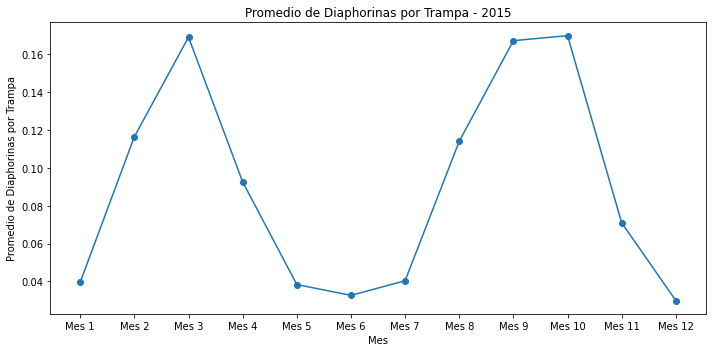

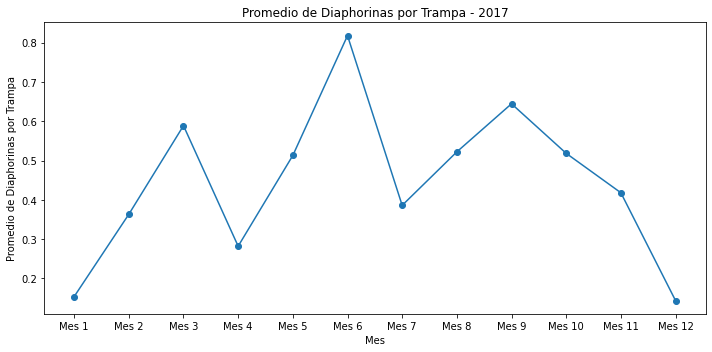

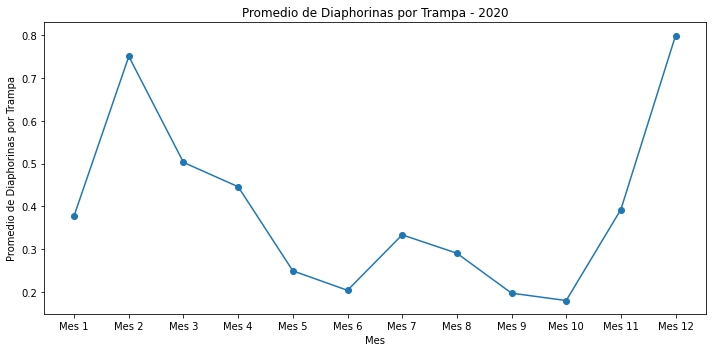

In [0]:
%python
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, year, month, mean

# Convertir la columna 'Fecha' a tipo fecha (si aún no lo está)
df_spark = df_spark.withColumn('Fecha', col('Fecha').cast('timestamp'))

# Extraer el año y el mes
df_spark = df_spark.withColumn('Año', year(col('Fecha')))
df_spark = df_spark.withColumn('Mes', month(col('Fecha')))

# Filtrar solo los años de interés
df_filtrado = df_spark.filter(col('Año').isin([2015, 2017, 2020]))

# Calcular el promedio por año y mes
promedios = df_filtrado.groupBy('Año', 'Mes').agg(mean('No_DiaphorinasXtrampa').alias('Promedio_Diaphorinas')).orderBy('Año', 'Mes')

# Convertir el resultado a un DataFrame de Pandas para graficar
promedios_pd = promedios.toPandas()

# Crear gráficas para cada año
for año in promedios_pd['Año'].unique():
    data_año = promedios_pd[promedios_pd['Año'] == año]
    
    plt.figure(figsize=(10, 5))
    plt.plot(data_año['Mes'], data_año['Promedio_Diaphorinas'], marker='o')
    plt.title(f'Promedio de Diaphorinas por Trampa - {año}')
    plt.xlabel('Mes')
    plt.ylabel('Promedio de Diaphorinas por Trampa')
    plt.xticks(ticks=data_año['Mes'], labels=[f'Mes {int(m)}' for m in data_año['Mes']])
    plt.tight_layout()
    plt.show()

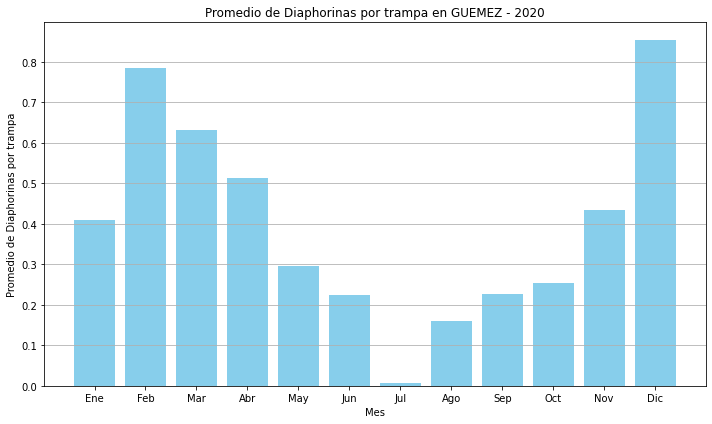

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, year, month, avg

# 1. Filtrar el DataFrame
municipio_deseado = 'GUEMEZ'  # Reemplaza con el nombre de tu municipio
df_filtered = df_spark.filter((col("Municipio") == municipio_deseado) & (year(col("Fecha")) == 2020))

# 2. Extraer el mes y calcular el promedio
df_monthly_avg = df_filtered.withColumn("Mes", month(col("Fecha"))) \
                             .groupBy("Mes") \
                             .agg(avg("No_DiaphorinasXtrampa").alias("Promedio_Diaphorinas"))

# Recoger los resultados como un Pandas DataFrame para graficar
results = df_monthly_avg.toPandas()

# 3. Graficar
plt.figure(figsize=(10, 6))
plt.bar(results['Mes'], results['Promedio_Diaphorinas'], color='skyblue')
plt.title(f'Promedio de Diaphorinas por trampa en {municipio_deseado} - 2020')
plt.xlabel('Mes')
plt.ylabel('Promedio de Diaphorinas por trampa')
plt.xticks(range(1, 13), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.grid(axis='y')
plt.tight_layout()
plt.show()

In [0]:
%python
from pyspark.sql.functions import year, month, mean, var_samp, sum as sum_
from pyspark.sql import functions as F

# Paso 1: Filtrar datos para el año 2015
df_2015 = df_spark.filter(year(df_spark['Fecha']) == 2015)

# Paso 2: Agregar una columna para el mes
df_2015 = df_2015.withColumn('Mes', month(df_2015['Fecha']))

# Paso 3: Agrupar por mes y ubicación
grouped = df_2015.groupBy('Mes', 'Ubicacion').agg(
    mean('No_DiaphorinasXtrampa').alias('xbar'),
    var_samp('No_DiaphorinasXtrampa').alias('var'),
    sum_('No_DiaphorinasXtrampa').alias('sumx')
)

# Paso 4: Calcular Id y Cx
grouped = grouped.withColumn('Id', grouped['var'] / grouped['xbar'])
grouped = grouped.withColumn('Cx', (grouped['Id'] - 1) / (grouped['sumx'] - 1))

# Paso 5: Crear la tabla final
result = grouped.select('Mes', 'Id', 'Cx')

# Mostrar resultados
result.show()


+---+----+----+
|Mes|  Id|  Cx|
+---+----+----+
|  6|null|null|
| 10|null|null|
|  5|null|null|
|  7|null|null|
|  2|null|null|
|  5| 1.0|null|
|  7|null|null|
|  2|null|null|
|  7|null|null|
|  8|null|null|
|  9|null|null|
|  3|null|null|
|  9|null|null|
|  9|null|null|
| 11|null|null|
| 11| 1.0|null|
|  7|null|null|
|  9|null|null|
| 12|null|null|
| 12|null|null|
+---+----+----+
only showing top 20 rows



In [0]:
display(result)

Mes,Id,Cx
6,null,null
10,null,null
5,null,null
7,null,null
2,null,null
5,1.0,null
7,null,null
2,null,null
7,null,null
8,null,null


In [0]:
# Supongamos que tienes un DataFrame llamado df_spark
result.describe().show()


+-------+----------------+------------------+------------------+
|summary|             Mes|                Id|                Cx|
+-------+----------------+------------------+------------------+
|  count|           97241|             12494|              6443|
|   mean|  6.611131107249|1.7846916212458122|0.5229150889001402|
| stddev|3.53557653524056| 2.079843936558416|0.4993763751764457|
|    min|               1|               0.0|              -0.5|
|    max|              12|            52.875|1.0000000000000004|
+-------+----------------+------------------+------------------+



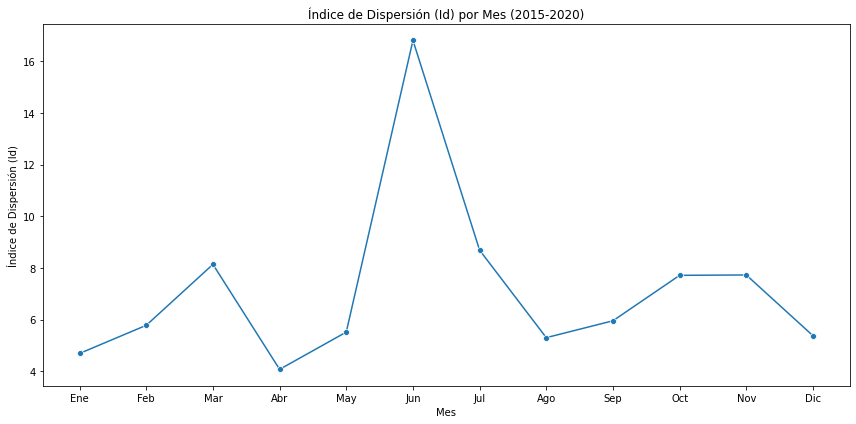

In [0]:
from pyspark.sql.functions import month, col, mean, variance

df_spark = df_spark.withColumn("Fecha", col("Fecha").cast("timestamp"))

# Extraer el mes
df_filtered = df_spark.withColumn("Mes", month(col("Fecha")))

# Eliminar filas con valores nulos en la columna de interés
df_filtered = df_filtered.filter(col("No_DiaphorinasXtrampa").isNotNull())

# Agrupar por 'Mes' y calcular la media y varianza
stats = df_filtered.groupBy("Mes").agg(
    mean("No_DiaphorinasXtrampa").alias("mean"),
    variance("No_DiaphorinasXtrampa").alias("var")
)

# Calcular el índice Id
stats = stats.withColumn("Id", col("var") / col("mean"))

# Colectar los resultados en un DataFrame de pandas para graficar
stats_pd = stats.toPandas()

import seaborn as sns
# Graficar el índice Id por mes
plt.figure(figsize=(12, 6))
sns.lineplot(data=stats_pd, x='Mes', y='Id', marker='o')
#plt.plot(stats_pd['Mes'], stats_pd['Id'], marker='o')
plt.title('Índice de Dispersión (Id) por Mes (2015-2020)')
plt.xlabel('Mes')
plt.ylabel('Índice de Dispersión (Id)')
plt.xticks(ticks=range(1, 13), labels=['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.tight_layout()  # Mejora el diseño
plt.show()


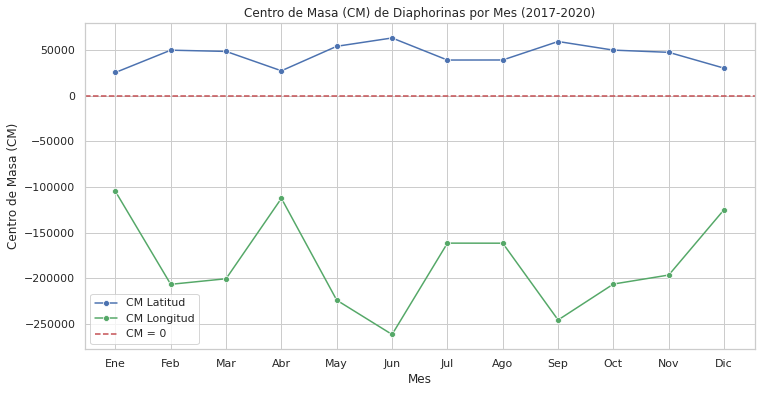

In [0]:

from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

df_spark = df_spark.withColumn('Fecha', F.to_date('Fecha'))

# Filtrar datos entre 2017 y 2020
df_spark = df_spark.withColumn('Año', F.year('Fecha'))
filtered_data = df_spark.filter((F.col('Año') >= 2017) & (F.col('Año') <= 2020))

# Agregar una columna para el mes
filtered_data = filtered_data.withColumn('Mes', F.month('Fecha'))

# Calcular el promedio de Diaphorinas por ubicación, mes, latitud y longitud
promedios = filtered_data.groupBy('Ubicacion', 'Mes', 'Latitud', 'Longitud') \
                         .agg(F.mean('No_DiaphorinasXtrampa').alias('Promedio_Diaph'))

# Contar el número de trampas por ubicación y mes
num_trampas = filtered_data.groupBy('Ubicacion', 'Mes') \
                           .agg(F.count('*').alias('Ntrampas'))

# Unir promedios y número de trampas
cm_data = promedios.join(num_trampas, on=['Ubicacion', 'Mes'], how='inner')

# Calcular el centro de masa (CM) para latitud y longitud por separado
cm_data = cm_data.withColumn('CM_Latitud', (F.col('Latitud') * F.col('Promedio_Diaph')) / F.col('Ntrampas')) \
                 .withColumn('CM_Longitud', (F.col('Longitud') * F.col('Promedio_Diaph')) / F.col('Ntrampas'))

# Agrupar para obtener el CM total por mes para latitud y longitud
cm_latitud_total = cm_data.groupBy('Mes') \
                           .agg(F.sum('CM_Latitud').alias('CM_Latitud'))

cm_longitud_total = cm_data.groupBy('Mes') \
                            .agg(F.sum('CM_Longitud').alias('CM_Longitud'))

# Unir ambos resultados
cm_total = cm_latitud_total.join(cm_longitud_total, on='Mes', how='inner')

# Convertir a Pandas para graficar
cm_total_pd = cm_total.toPandas()

# Configura el estilo de la gráfica
sns.set(style="whitegrid")

# Graficar el CM por mes para latitud y longitud usando sns.lineplot
plt.figure(figsize=(12, 6))

# Graficar CM de Latitud
sns.lineplot(data=cm_total_pd, x='Mes', y='CM_Latitud', marker='o', label='CM Latitud', color='b')

# Graficar CM de Longitud
sns.lineplot(data=cm_total_pd, x='Mes', y='CM_Longitud', marker='o', label='CM Longitud', color='g')

# Personalizar la gráfica
plt.title('Centro de Masa (CM) de Diaphorinas por Mes (2017-2020)')
plt.xlabel('Mes')
plt.ylabel('Centro de Masa (CM)')
plt.xticks(range(1, 13), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.axhline(y=0, color='r', linestyle='--', label='CM = 0')
plt.legend()
plt.show()
